# OpenCV FreeCodeCamp training Implementation

In this Tutorial of OpenCv we included code on how to

Import OpenCV

Read an Image

Read a video File

Read video from webcam

Rescal image/frame

Draw and write on images

Converting image to Greyscale

Blurring the image

Create Edge Cascade

How to Dilate an image

Resize the image

Cropping the image

Image Translation

Image Rotation

Image Flipping

Contour Detection

In [2]:
import cv2 as cv
import numpy as np
#import caer
import matplotlib.pyplot as plt
import sys

In [3]:
!python --version

Python 3.8.8


In [4]:
#function to display multiple images in notebook
def show1(img1, img2):
    fig = plt.figure(figsize=(20, 20))
    img1 = cv.cvtColor(img1, cv.COLOR_BGR2RGB)
    ax = fig.add_subplot(1, 2, 1)
    plt.imshow(img1)
    plt.title('Image')
    plt.xticks([])
    plt.yticks([])
    
    img2 = cv.cvtColor(img2, cv.COLOR_BGR2RGB)
    ax = fig.add_subplot(1, 2, 2)
    plt.imshow(img2)
    plt.title('Resulting Image')
    plt.xticks([])
    plt.yticks([])

Text(0.5, 1.0, 'Image')

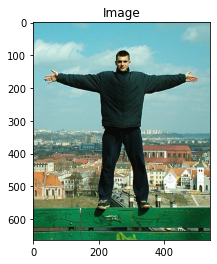

In [8]:
#reading the image
img = cv.imread('00.jpg')
img = cv.cvtColor(img, cv.COLOR_BGR2RGB)
#desplay the image
plt.imshow(img)
plt.title('Image')


In [5]:
#reading the video from file
capture = cv.VideoCapture('car2.mp4')
while True:
    isTrue, frame = capture.read()
    
    #dispalying the video
    cv.imshow('Frame', frame)
    if cv.waitKey(20) & 0xFF==ord('d'):
        break
capture.release()
cv.destroyAllWindows()

In [6]:
#reading the video from webcam
capture = cv.VideoCapture(0)
while True:
    isTrue, frame = capture.read()
    
    #dispalying the video
    cv.imshow('Frame', frame)
    if cv.waitKey(20) & 0xFF==ord('d'):
        break
capture.release()
cv.destroyAllWindows()

# Rescaling image/frame

In [7]:
#Function to rescale the frame/image
#this will work for images, videos and live videos
def rescaleFrame(frame, scale = 0.75):
    width = int(frame.shape[1]*scale)
    height = int(frame.shape[0]*scale)
    dimensions = (width,height)
    out = cv.resize(frame, dimensions, interpolation = cv.INTER_AREA)
    return out

In [12]:
#testing on image
img = cv.imread('00.jpg')
img2 = rescaleFrame(img, 0.5)
#desplay the image
cv.imshow('Image', img)
cv.imshow('Image1', img2)
cv.waitKey(0)
cv.destroyAllWindows()

In [13]:
#testing on video
capture = cv.VideoCapture('car2.mp4')
while True:
    isTrue, frame = capture.read()
    frame2 = rescaleFrame(frame, 0.2)
    
    #dispalying the video
    cv.imshow('Frame', frame)
    cv.imshow('Frame2', frame2)
    if cv.waitKey(20) & 0xFF==ord('d'):
        break
capture.release()
cv.destroyAllWindows()

# Changing resolution

In [14]:
#this will only work for live videos
def changeRes(width, height):
    capture.set(3, width)
    capture.set(4, height)
    return capture

In [15]:
#testing on video
capture = cv.VideoCapture(0)
while True:
    isTrue, frame = capture.read()
    frame2 = rescaleFrame(frame, 0.2)
    
    #dispalying the video
    cv.imshow('Frame', frame)
    cv.imshow('Frame2', frame2)
    if cv.waitKey(20) & 0xFF==ord('d'):
        break
capture.release()
cv.destroyAllWindows()

# Draw and write on images

In [16]:
#creating a blank image
blank = np.zeros((700, 700, 3), dtype = 'uint8')

#desplay the image
cv.imshow('Image', blank)

#paint the image a certain color
blank[:]=0, 255, 0
cv.imshow('Image1', blank)

#paint a certain area in image a certain color
blank[200:300, 300:400]=0, 0, 255
cv.imshow('Image2', blank)

cv.waitKey(0)
cv.destroyAllWindows()

In [17]:
#draw a rectangle
img = cv.imread('00.jpg')

cv.rectangle(img, (10, 10), (250, 250), (0, 0, 255), thickness = 1)
cv.imshow('Image', img)
cv.waitKey(0)
cv.destroyAllWindows()

In [18]:
#draw a rectangle and fill it
img = cv.imread('00.jpg')

cv.rectangle(img, (10, 10), (250, 250), (0, 0, 255), thickness = cv.FILLED) #or put -1 in place of filled
cv.imshow('Image', img)
cv.waitKey(0)
cv.destroyAllWindows()

In [19]:
#draw a Circle 
img = cv.imread('road2.jpg')

cv.circle(img, (img.shape[1]//2,img.shape[0]//2), 40, (0, 0, 255), thickness = 3) 
cv.imshow('Image', img)
cv.waitKey(0)
cv.destroyAllWindows()

In [20]:
#draw a Circle and fill it
img = cv.imread('road2.jpg')

cv.circle(img, (img.shape[1]//2,img.shape[0]//2), 40, (0, 0, 255), thickness = -1) 
cv.imshow('Image', img)
cv.waitKey(0)
cv.destroyAllWindows()

In [21]:
#draw a line
img = cv.imread('road2.jpg')

cv.line(img, (0, 0), (img.shape[1]//2,img.shape[0]//2), (0, 0, 255), thickness = 3) 
cv.imshow('Image', img)
cv.waitKey(0)
cv.destroyAllWindows()

In [22]:
#write text
img = cv.imread('road2.jpg')

cv.putText(img, 'This is a Road Picture', (img.shape[1]//4,img.shape[0]//2),cv.FONT_HERSHEY_TRIPLEX, 
           fontScale = 1.45, color = (0, 0, 255),thickness = 3) 
cv.imshow('Image', img)
cv.waitKey(0)
cv.destroyAllWindows()

# Essential Functions

Converting image to Greyscale

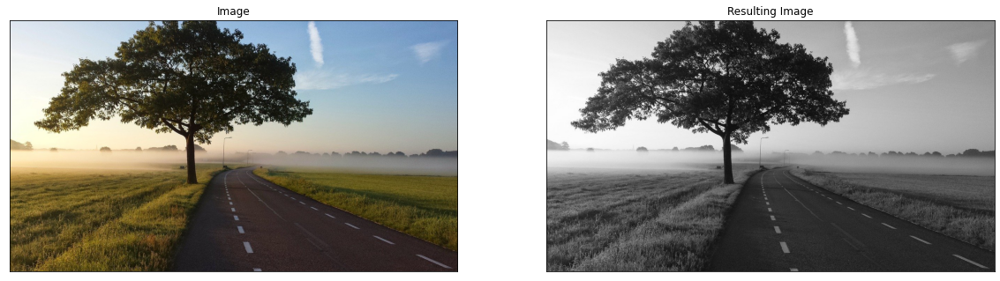

In [41]:
#Converting image to Greyscale
img = cv.imread('road2.jpg')

grey = cv.cvtColor(img, cv.COLOR_BGR2GRAY) 
#cv.imshow('Image', img)
#cv.imshow('Image1', grey)
#cv.waitKey(0)
#cv.destroyAllWindows()
show1(img, grey)

Blurring the image

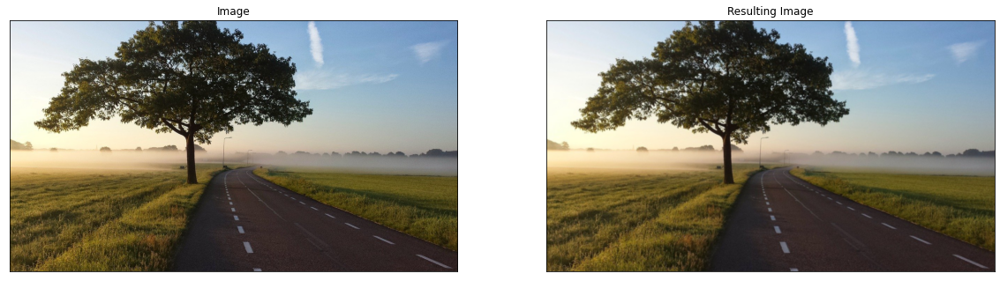

In [44]:
#Blurring the image
img = cv.imread('road2.jpg')

blur = cv.GaussianBlur(img, (3,3),cv.BORDER_DEFAULT) #to increase blur increase kernel size e.g(7,7)
#cv.imshow('Image', img)
#cv.imshow('Image1', blur)
#cv.waitKey(0)
#cv.destroyAllWindows()
show1(img, blur)

Create Edge Cascade

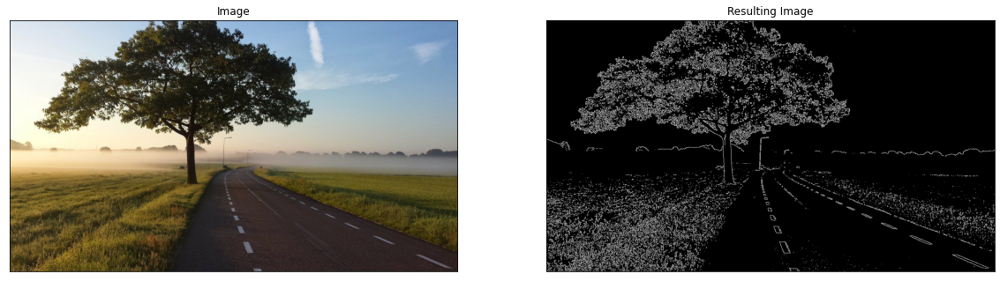

In [46]:
#canny edge detection
img = cv.imread('road2.jpg')

canny = cv.Canny(img, 175, 175) #can reduce edges by applying blur first and then canny
#cv.imshow('Image', img)
#cv.imshow('Image1', canny)
#cv.waitKey(0)
#cv.destroyAllWindows()
show1(img, canny)

How to Dilate an image

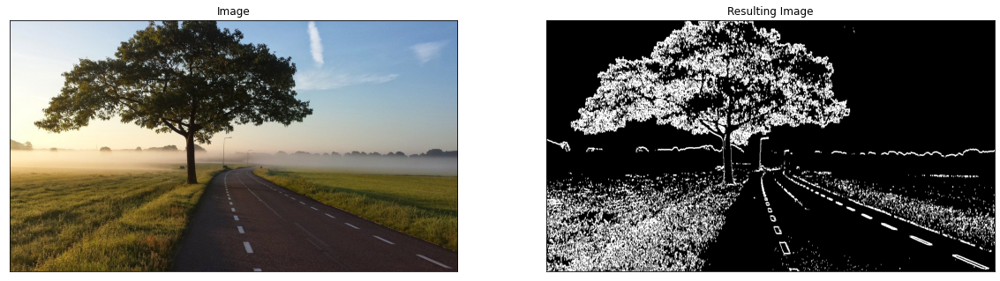

In [47]:
# Dilate an image by applying structuring element
img = cv.imread('road2.jpg')

#first apply canny and then apply dilate
canny = cv.Canny(img, 175, 175) 
dilated = cv.dilate(canny, (3, 3), iterations = 3)
#cv.imshow('Image', img)
#cv.imshow('Image1', dilated)
#cv.waitKey(0)
#cv.destroyAllWindows()
show1(img, dilated)

Eroding the dilated image to get back original canny image

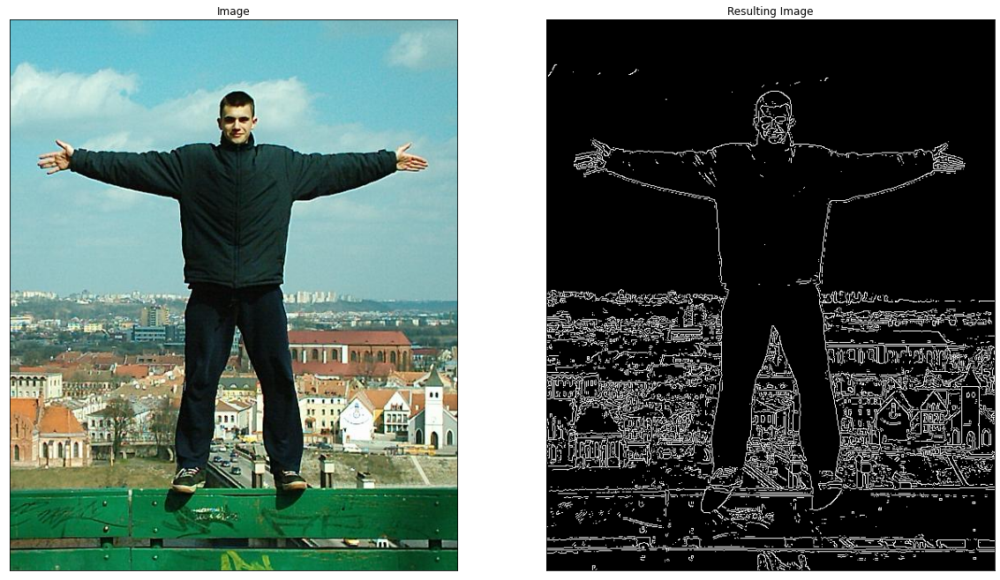

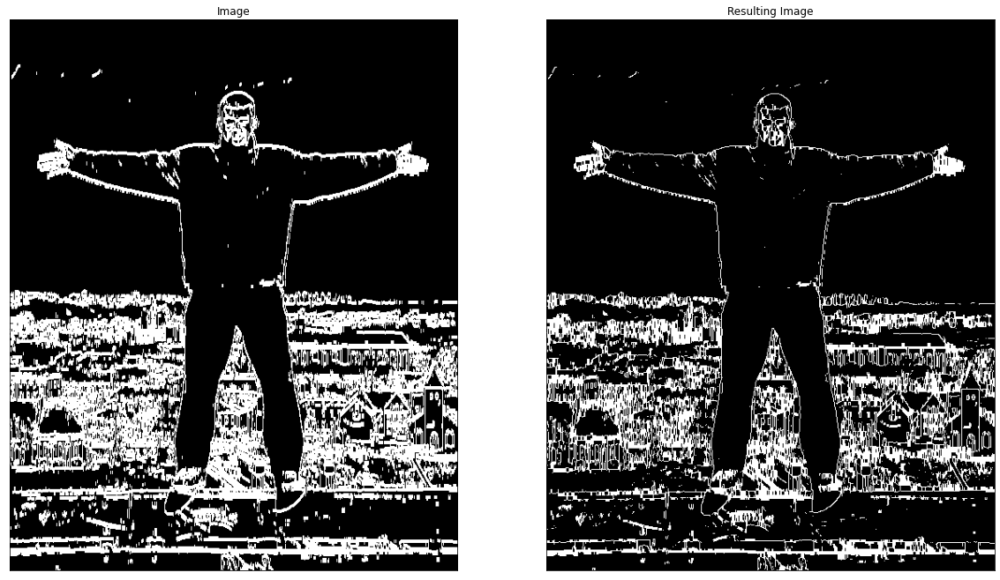

In [48]:
#Eroding the dilated image to get back original canny image
#img = cv.imread('road2.jpg')
img = cv.imread('00.jpg')

#first apply canny and then apply dilate then apply erode
canny = cv.Canny(img, 175, 175) 
dilated = cv.dilate(canny, (3, 3), iterations = 3)
eroded = cv.erode(dilated, (3, 3), iterations = 3)

#cv.imshow('Image', img)
#cv.imshow('Image1', canny)
#cv.imshow('Image2', dilated)
#cv.imshow('Image3', eroded)
#cv.waitKey(0)
#cv.destroyAllWindows()
show1(img, canny)
show1(dilated, eroded)

Resize the image

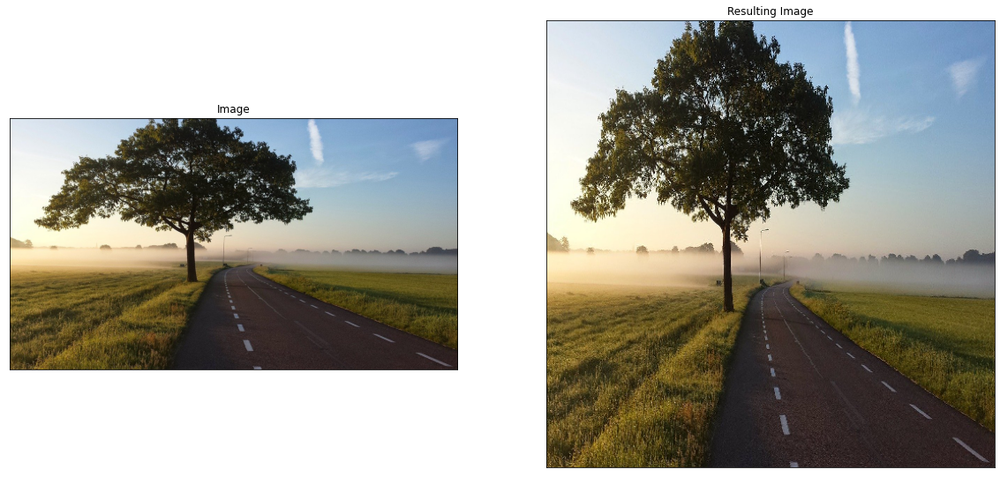

In [49]:
# Resizing
img = cv.imread('road2.jpg')

resized = cv.resize(img, (500, 500), interpolation = cv.INTER_CUBIC)
#cv.imshow('Image', img)
#cv.imshow('Image1', resized)
#cv.waitKey(0)
#cv.destroyAllWindows()
show1(img, resized)

Cropping the image

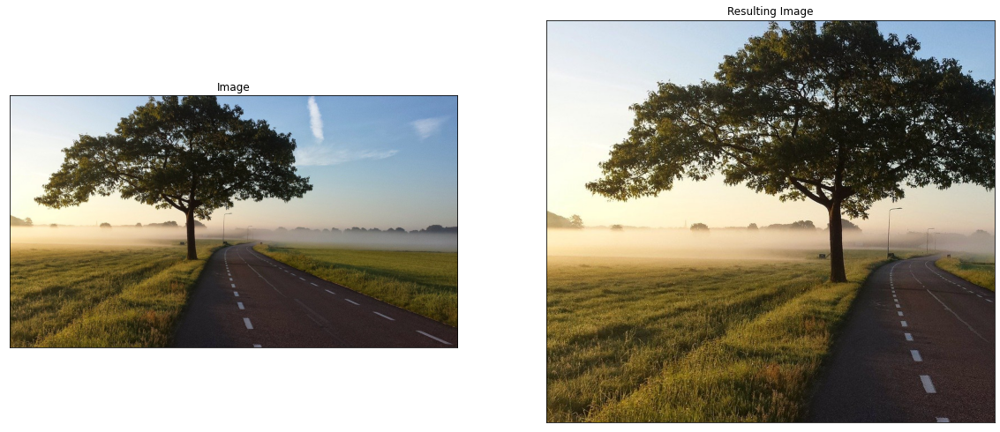

In [50]:
# Cropping
img = cv.imread('road2.jpg')

cropped = img[0:800, 0:800]
#cv.imshow('Image', img)
#cv.imshow('Image1', cropped)
#cv.waitKey(0)
#cv.destroyAllWindows()
show1(img, cropped)

# Image Transformations

Image Translation

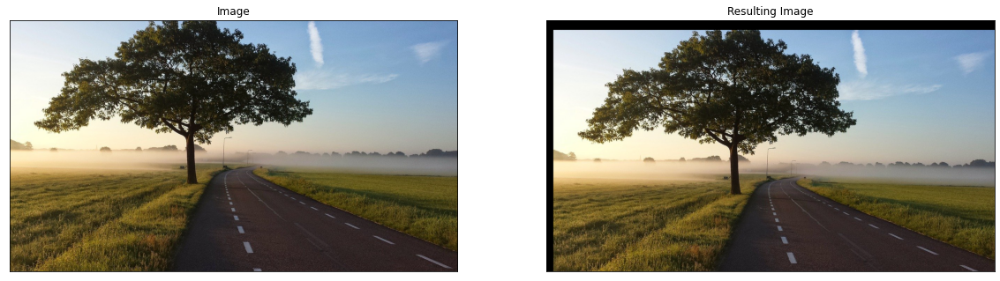

In [51]:
# Image Translation
def translate(img, x, y):
    
    # -x means shifting image to left
    # +x means shifting image to right
    # -y means shifting image up
    # +y means shifting image down
    
    transMat = np.float32([[1, 0, x], [0, 1, y]])
    dimensions = (img.shape[1],img.shape[0]) #(w, h)
    return cv.warpAffine(img, transMat, dimensions)

#Testing on image
img = cv.imread('road2.jpg')

trans = translate(img, 20, 30)
#cv.imshow('Image', img)
#cv.imshow('Image1', trans)
#cv.waitKey(0)
#cv.destroyAllWindows()
show1(img, trans)

Image Rotation

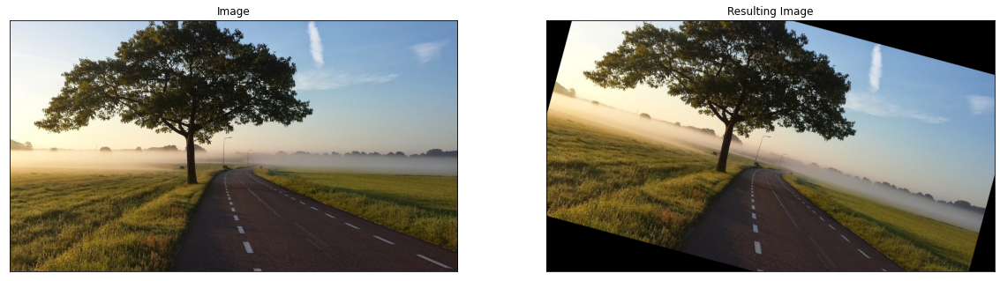

In [52]:
# Image Rotation
def rotate(img, angle, rotPoint=None):
    (height, width) = img.shape[:2]
    
    if rotPoint is None:
        rotPoint = (width//2, height//2)
        
    rotMat = cv.getRotationMatrix2D(rotPoint, angle, 1.0)
    dimensions = (width, height)
    return cv.warpAffine(img, rotMat, dimensions)

#Testing on image
img = cv.imread('road2.jpg')

rotated = rotate(img, -15)
#cv.imshow('Image', img)
#cv.imshow('Image1', rotated)
#cv.waitKey(0)
#cv.destroyAllWindows()
show1(img, rotated)

Image Flipping

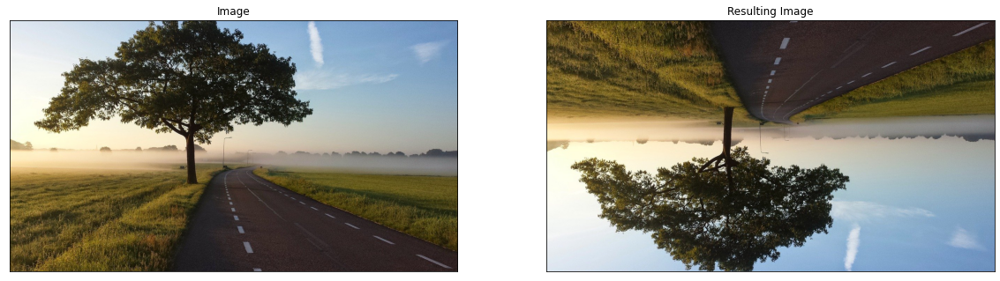

In [53]:
#Flipping image
img = cv.imread('road2.jpg')

flipped = cv.flip(img, 0)
    #0 means flip vertically
    #1 means flip horizontally
    #-1 means flip both vertically and horizontally

#cv.imshow('Image', img)
#cv.imshow('Image1', flipped)
#cv.waitKey(0)
#cv.destroyAllWindows()
show1(img, flipped)

# Contour Detection

In [ ]:
#contour detection
img = cv.imread('road1.jpg')

#converting image to greyscale
grey = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

#getting edges of image using canny edge detection
canny = cv.Canny(img, 125, 175)

#finding contour
contours, hierarchies = cv.findContours(canny, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)
#contours is essentially a list of coordinates of all the contours found in the image
#hierarchies is hierarchicale representation of contours
print(f'{len(contours)} contour(s) found')

#finding contour
contours, hierarchies = cv.findContours(canny, cv.RETR_LIST, cv.CHAIN_APPROX_SIMPLE)
print(f'{len(contours)} contour(s) found')

In [ ]:
#playing with contour detection
img = cv.imread('road1.jpg')

#converting image to greyscale
grey = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

#blurring the image to reduce edges
blur = cv.GaussianBlur(grey, (5, 5), cv.BORDER_DEFAULT)

#getting edges of image using canny edge detection
canny = cv.Canny(blur, 125, 175)

#finding contour
contours, hierarchies = cv.findContours(canny, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)
print(f'{len(contours)} contour(s) found')

9600 contour(s) found


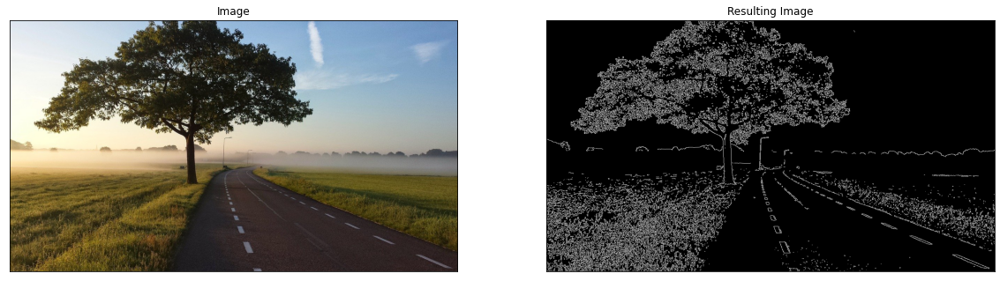

In [55]:
#playing with contour detection
img = cv.imread('road2.jpg')
blank = np.zeros(img.shape, dtype = 'uint8')

#converting image to greyscale
grey = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

#getting edges of image using canny edge detection
canny = cv.Canny(grey, 125, 175)

#finding contour
contours, hierarchies = cv.findContours(canny, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)
print(f'{len(contours)} contour(s) found')

#drawing contours on blank image
cv.drawContours(blank, contours, -1, (255, 255, 255), 1)

#cv.imshow('Image', img)
#cv.imshow('Image1', blank)
#cv.waitKey(0)
#cv.destroyAllWindows()
show1(img, blank)

6097 contour(s) found


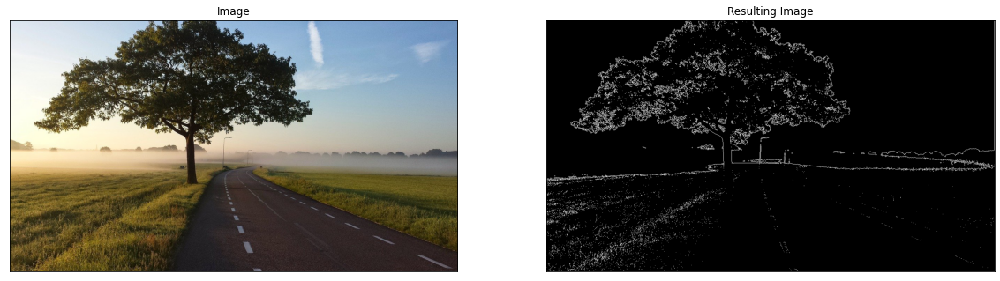

In [57]:
#contour detection without using canny edge detection
img = cv.imread('road2.jpg')
blank = np.zeros(img.shape, dtype = 'uint8')

#converting image to greyscale
grey = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

ret, thresh = cv.threshold(grey, 125, 255, cv.THRESH_BINARY)

#finding contour
contours, hierarchies = cv.findContours(thresh, cv.RETR_LIST, cv.CHAIN_APPROX_NONE)
print(f'{len(contours)} contour(s) found')

#drawing contours on blank image
cv.drawContours(blank, contours, -1, (255, 255, 255), 1)

#cv.imshow('Image', img)
#cv.imshow('Image1', blank)
#cv.waitKey(0)
#cv.destroyAllWindows()
show1(img, blank)

# Color Spaces

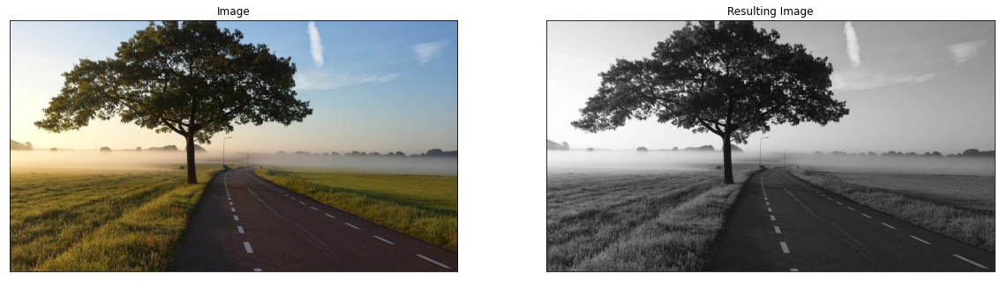

In [10]:
img = cv.imread('road2.jpg')

#converting from BGRto GreyScale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

show1(img, gray)


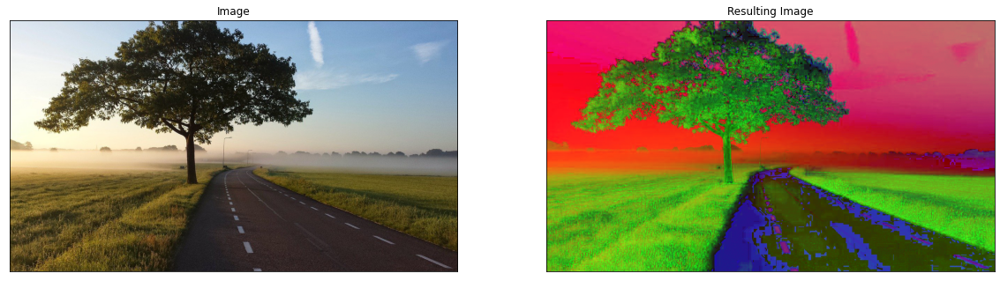

In [11]:
img = cv.imread('road2.jpg')

#converting from BGR to HSV
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

show1(img, hsv)

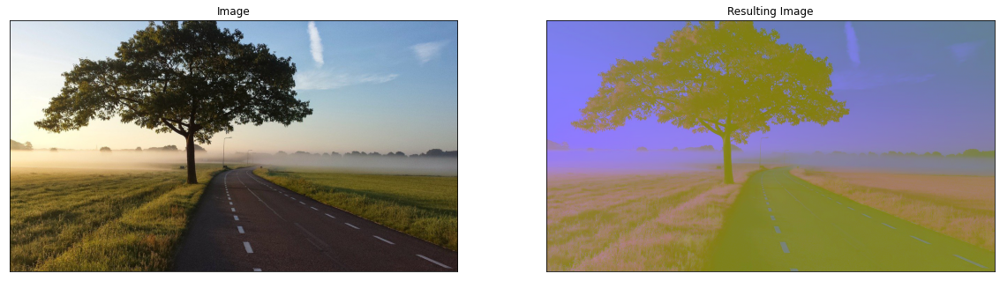

In [13]:
img = cv.imread('road2.jpg')

#converting from BGR to LAB
lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)

show1(img, lab)

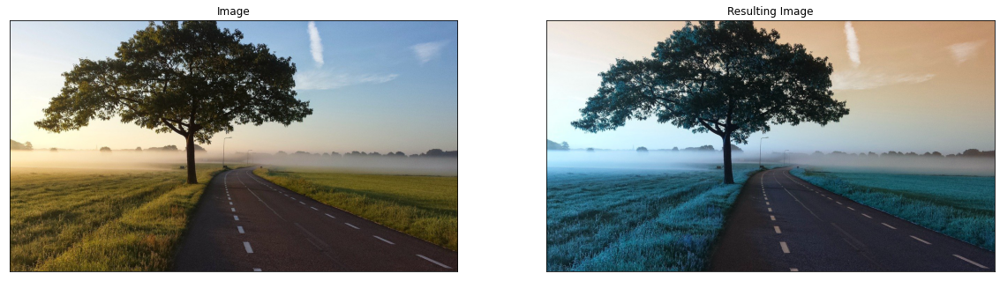

In [15]:
img = cv.imread('road2.jpg')

#converting from BGR to RGB
lab = cv.cvtColor(img, cv.COLOR_BGR2RGB) 

show1(img, lab) #since we are doing it in show1 function so here first image will be RGB second image will be BGR

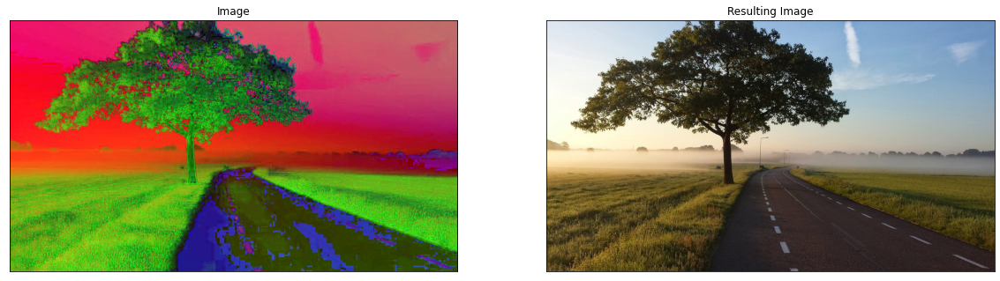

In [16]:
img = cv.imread('road2.jpg')

#converting from BGR to HSV
hsv = cv.cvtColor(img, cv.COLOR_BGR2HSV)

#converting from HSV to BGR
hsv_bgr = cv.cvtColor(hsv, cv.COLOR_HSV2BGR)


show1(hsv, hsv_bgr)

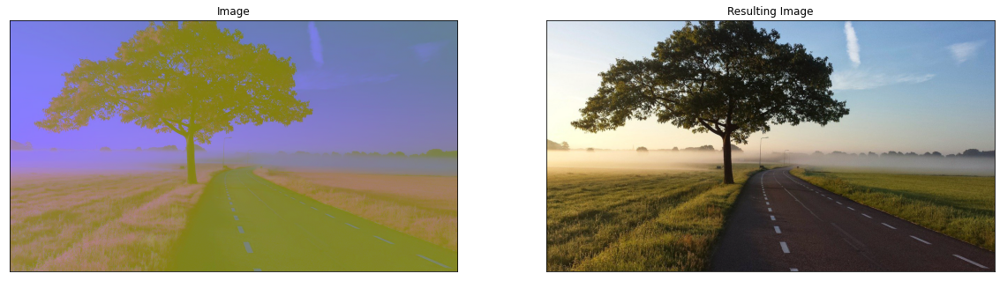

In [17]:
img = cv.imread('road2.jpg')

#converting from BGR to LAB
lab = cv.cvtColor(img, cv.COLOR_BGR2LAB)

#converting from LAB to BGR
lab_bgr = cv.cvtColor(lab, cv.COLOR_LAB2BGR)

show1(lab, lab_bgr)

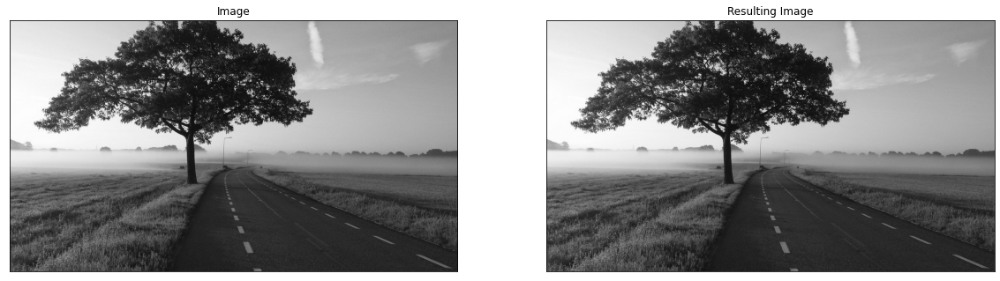

In [21]:
img = cv.imread('road2.jpg')

#converting from BGRto GreyScale
gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

#converting from GreyScale to BGR
gray_bgr = cv.cvtColor(gray, cv.COLOR_GRAY2RGB)

show1(gray, gray_bgr)